# Process Data

Extract data for 3 sites from each parquet file.

Reformat to wide dataframe.

Resample to X-minute.

Add features.

Min/Max scaler.

Save to /processed/

## Imports and Setup

In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import joblib
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
import hvplot.pandas

In [2]:
pqdir = Path('c:/projects/nrel-presentation/data/interim')

## Extract data for sites

upstream site   = 447_2_351

main site       = 446_1_350

downstream site = 446_3_349

In [3]:
sites = ['447_2_351', '446_1_350', '446_3_349']

In [7]:
all_results = []
all_pq = pqdir.glob('*.pq')
i = 0
for this_pq in all_pq:
    print(i, end=', ')
    df = pd.read_parquet(this_pq)

    # site: 446_1_350
    a = df[(df['detector_id'] == sites[1]) & (df['detector_lane_number'] == 1)][['timestamp', 'lane_vehicle_speed', 'lane_vehicle_count', 'occupancy']]
    
    if not a.empty:
        a.index = [0]

        # upstream site: 447_2_351
        us = df[(df['detector_id'] == sites[0]) & (df['detector_lane_number'] == 1)][['lane_vehicle_speed', 'lane_vehicle_count', 'occupancy']]
        if us.empty:
            us = pd.DataFrame([[np.nan, np.nan, np.nan]], columns=['us_lane_vehicle_speed', 'us_lane_vehicle_count', 'us_occupancy'])
            print('us empty')
        else:
            us.index = [0]

        # downstream site: 446_3_349
        ds = df[(df['detector_id'] == sites[2]) & (df['detector_lane_number'] == 1)][['lane_vehicle_speed', 'lane_vehicle_count', 'occupancy']]
        if ds.empty:
            ds = pd.DataFrame([[np.nan, np.nan, np.nan]], columns=['ds_lane_vehicle_speed', 'ds_lane_vehicle_count', 'ds_occupancy'])
            print('ds empty')
        else:
            ds.index = [0]


    D = pd.concat([a, us, ds], axis=1, ignore_index=True)

    all_results.append(D)
    
    i += 1
    
D2 = pd.concat(all_results)
D2.columns = ['timestamp', 'lane_vehicle_speed', 'lane_vehicle_count', 'occupancy', \
              'ds_lane_vehicle_speed', 'ds_lane_vehicle_count', 'ds_occupancy', 'us_lane_vehicle_speed', 'us_lane_vehicle_count', 'us_occupancy']


0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 

ValueError: Length mismatch: Expected axis has 10 elements, new values have 7 elements

In [49]:
D2 = pd.concat(all_results)
D2.columns = ['timestamp', 'lane_vehicle_speed', 'lane_vehicle_count', 'occupancy', \
              'ds_lane_vehicle_speed', 'ds_lane_vehicle_count', 'ds_occupancy', 'us_lane_vehicle_speed', 'us_lane_vehicle_count', 'us_occupancy']

In [50]:
D2.set_index('timestamp', inplace=True)
D2 = D2[~D2.index.duplicated(keep='first')]
D2.head()

,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,us_lane_vehicle_speed,us_lane_vehicle_count,us_occupancy
timestamp,,,,,,,,,
2021-10-26 20:01:27,100.0,1.0,0.0,82,3,0,74,2,0
2021-10-26 20:02:27,79.0,3.0,0.0,86,7,2,91,1,0
2021-10-26 20:03:27,88.0,9.0,2.0,88,2,0,81,6,2
2021-10-26 20:04:27,86.0,3.0,0.0,81,2,0,84,7,2
2021-10-26 20:05:27,79.0,2.0,0.0,85,4,1,84,2,0


In [51]:
D2.tail()

,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,us_lane_vehicle_speed,us_lane_vehicle_count,us_occupancy
timestamp,,,,,,,,,
2021-11-16 10:11:06,80.0,1.0,0.0,149,0,0,91,2,0
2021-11-16 10:12:06,149.0,0.0,0.0,92,1,0,80,1,0
2021-11-16 10:13:06,89.0,1.0,0.0,86,5,1,89,1,0
2021-11-16 10:14:06,81.0,4.0,1.0,86,5,1,83,1,0
2021-11-16 10:15:06,78.0,4.0,1.0,81,8,2,82,5,1


In [52]:
D2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 26268 entries, 2021-10-26 20:01:27 to 2021-11-16 10:15:06
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   lane_vehicle_speed     26267 non-null  float64
 1   lane_vehicle_count     26267 non-null  float64
 2   occupancy              26267 non-null  float64
 3   ds_lane_vehicle_speed  26268 non-null  int64  
 4   ds_lane_vehicle_count  26268 non-null  int64  
 5   ds_occupancy           26268 non-null  int64  
 6   us_lane_vehicle_speed  26268 non-null  int64  
 7   us_lane_vehicle_count  26268 non-null  int64  
 8   us_occupancy           26268 non-null  int64  
dtypes: float64(3), int64(6)
memory usage: 2.0 MB


In [53]:
# clean
#   speeds > 120 = np.nan
idx1 = D2['lane_vehicle_speed'] > 119
idx2 = D2['ds_lane_vehicle_speed'] > 119
idx3 = D2['us_lane_vehicle_speed'] > 119

In [54]:
print(idx1.sum(), idx2.sum(), idx3.sum())

2550 2535 2641


In [55]:
D2.loc[idx1, 'lane_vehicle_speed'] = np.nan
D2.loc[idx2, 'ds_lane_vehicle_speed'] = np.nan
D2.loc[idx3, 'us_lane_vehicle_speed'] = np.nan

In [56]:
D2.shape

(26268, 9)

In [57]:
# sort by index
D2.sort_index(inplace=True)

In [17]:
#D2.to_excel(Path('c:/projects/nrel-presentation/working/D2.xlsx'))

In [58]:
# plot
D2.hvplot.line(y='lane_vehicle_speed', use_index=True, width=1300)

:Curve   [timestamp]   (lane_vehicle_speed)

## Fill in Gaps

In [59]:
# 11/01 and 11/02
#  fill in this data with same hours from previous day
#   missing from 2021-11-01 19:36 to 2021-11-02 13:02
#   repeat data from 2021-10-31 19:36 to 2021-11-01 13:02
D2.loc['2021-10-31 19:35' : '2021-11-01 13:03']

C:\Users\David\AppData\Local\Temp/ipykernel_24460/2187780894.py:5: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  D2.loc['2021-10-31 19:35' : '2021-11-01 13:03']


,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,us_lane_vehicle_speed,us_lane_vehicle_count,us_occupancy
timestamp,,,,,,,,,
2021-10-31 19:35:21,86.0,7.0,1.0,86.0,8,2,84.0,8,2
2021-10-31 19:36:21,87.0,7.0,1.0,82.0,3,1,84.0,8,2
2021-10-31 19:37:21,79.0,9.0,2.0,85.0,6,1,89.0,3,0
2021-10-31 19:38:21,82.0,6.0,1.0,80.0,9,3,79.0,8,3
2021-10-31 19:39:21,80.0,7.0,2.0,82.0,1,0,78.0,6,2
...,...,...,...,...,...,...,...,...,...
2021-11-01 12:59:14,84.0,10.0,3.0,87.0,6,1,78.0,19,7
2021-11-01 13:00:14,86.0,2.0,0.0,82.0,17,5,80.0,8,3
2021-11-01 13:01:14,86.0,5.0,1.0,79.0,13,4,80.0,4,1


In [60]:
# add a day
newdf = D2.loc['2021-10-31 19:35' : '2021-11-01 13:03'].copy()
newindex = newdf.index.values
newdf.index = pd.DatetimeIndex([dt + pd.Timedelta('1D') for dt in newindex])
newdf.head()

C:\Users\David\AppData\Local\Temp/ipykernel_24460/984216267.py:2: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  newdf = D2.loc['2021-10-31 19:35' : '2021-11-01 13:03'].copy()


,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,us_lane_vehicle_speed,us_lane_vehicle_count,us_occupancy
2021-11-01 19:35:21,86.0,7.0,1.0,86.0,8,2,84.0,8,2
2021-11-01 19:36:21,87.0,7.0,1.0,82.0,3,1,84.0,8,2
2021-11-01 19:37:21,79.0,9.0,2.0,85.0,6,1,89.0,3,0
2021-11-01 19:38:21,82.0,6.0,1.0,80.0,9,3,79.0,8,3
2021-11-01 19:39:21,80.0,7.0,2.0,82.0,1,0,78.0,6,2


In [61]:
# concatenate, sort_index
D2 = pd.concat([D2, newdf])
D2.sort_index(inplace=True)

In [62]:
# check with plot
D2.hvplot.line(y='lane_vehicle_speed', use_index=True, width=1300)

:Curve   [index]   (lane_vehicle_speed)

In [63]:
# same thing with 2021-11-05 15:46 to 20:03
# add a day
newdf = D2.loc['2021-11-04 15:45' : '2021-11-04 20:04'].copy()
newindex = newdf.index.values
newdf.index = pd.DatetimeIndex([dt + pd.Timedelta('1D') for dt in newindex])
# concatenate, sort_index
D2 = pd.concat([D2, newdf])
D2.sort_index(inplace=True)
# check with plot
D2.hvplot.line(y='lane_vehicle_speed', use_index=True, width=1300)

C:\Users\David\AppData\Local\Temp/ipykernel_24460/1880543427.py:3: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  newdf = D2.loc['2021-11-04 15:45' : '2021-11-04 20:04'].copy()


:Curve   [index]   (lane_vehicle_speed)

In [64]:
# same thing with 2021-11-08 12:23 to 15:23
# add a day
newdf = D2.loc['2021-11-07 12:22' : '2021-11-07 15:24'].copy()
newindex = newdf.index.values
newdf.index = pd.DatetimeIndex([dt + pd.Timedelta('1D') for dt in newindex])
# concatenate, sort_index
D2 = pd.concat([D2, newdf])
D2.sort_index(inplace=True)
# check with plot
D2.hvplot.line(y='lane_vehicle_speed', use_index=True, width=1300)

C:\Users\David\AppData\Local\Temp/ipykernel_24460/2578557417.py:3: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  newdf = D2.loc['2021-11-07 12:22' : '2021-11-07 15:24'].copy()


:Curve   [index]   (lane_vehicle_speed)

In [65]:
# same thing with 2021-11-09 00:03 to 08:12
# add a day
newdf = D2.loc['2021-11-08 00:02' : '2021-11-08 08:13'].copy()
newindex = newdf.index.values
newdf.index = pd.DatetimeIndex([dt + pd.Timedelta('1D') for dt in newindex])
# concatenate, sort_index
D2 = pd.concat([D2, newdf])
D2.sort_index(inplace=True)
# check with plot
D2.hvplot.line(y='lane_vehicle_speed', use_index=True, width=1300)

C:\Users\David\AppData\Local\Temp/ipykernel_24460/1484982418.py:3: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  newdf = D2.loc['2021-11-08 00:02' : '2021-11-08 08:13'].copy()


:Curve   [index]   (lane_vehicle_speed)

In [66]:
# truncate after 11/15 21:00
D2 = D2.iloc[:-1]
D2.sort_index(inplace=True)

In [67]:
D2 = D2.truncate(after=pd.Timestamp('2021-11-15 21:00'))
D2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 28083 entries, 2021-10-26 20:01:27 to 2021-11-15 20:59:10
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   lane_vehicle_speed     25271 non-null  float64
 1   lane_vehicle_count     28083 non-null  float64
 2   occupancy              28083 non-null  float64
 3   ds_lane_vehicle_speed  25297 non-null  float64
 4   ds_lane_vehicle_count  28083 non-null  int64  
 5   ds_occupancy           28083 non-null  int64  
 6   us_lane_vehicle_speed  25188 non-null  float64
 7   us_lane_vehicle_count  28083 non-null  int64  
 8   us_occupancy           28083 non-null  int64  
dtypes: float64(5), int64(4)
memory usage: 2.1 MB


In [68]:
# just in case, remove duplicates
D2 = D2[~D2.index.duplicated(keep='first')]

In [69]:
D2.hvplot.line(y='lane_vehicle_speed', use_index=True, width=1300)

:Curve   [index]   (lane_vehicle_speed)

## Resample data

! warning. resampling is just a groupby wrt time. ideally we would
create a new x-minute index and do a proper interpolation using scipy, 
but for now we'll just go with the resampling that pandas gives us.

In [71]:
Data = D2.resample('10T', label='right', closed='right').mean().interpolate()

In [72]:
Data.head()

,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,us_lane_vehicle_speed,us_lane_vehicle_count,us_occupancy
2021-10-26 20:10:00,85.125000,2.888889,0.333333,83.375000,2.555556,0.333333,81.444444,3.000000,0.555556
2021-10-26 20:20:00,81.400000,2.500000,0.200000,80.555556,2.700000,0.500000,78.444444,2.600000,0.500000
2021-10-26 20:30:00,79.375000,2.900000,0.400000,82.250000,2.800000,0.500000,79.333333,2.700000,0.600000
2021-10-26 20:40:00,84.444444,2.900000,0.500000,84.200000,2.500000,0.300000,83.888889,1.900000,0.300000
2021-10-26 20:50:00,81.555556,2.666667,0.222222,83.625000,2.222222,0.333333,81.250000,3.111111,0.777778


In [73]:
Data.tail()

,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,us_lane_vehicle_speed,us_lane_vehicle_count,us_occupancy
2021-11-15 20:20:00,85.875000,4.000000,0.625000,84.857143,3.00,0.500000,83.125000,2.625000,0.500000
2021-11-15 20:30:00,80.444444,4.222222,0.666667,80.777778,4.00,0.777778,77.111111,3.666667,0.888889
2021-11-15 20:40:00,79.750000,3.700000,0.600000,80.700000,4.00,0.800000,78.777778,4.000000,1.100000
2021-11-15 20:50:00,82.375000,4.500000,0.750000,81.500000,4.25,0.875000,81.142857,3.125000,0.625000
2021-11-15 21:00:00,82.600000,3.900000,0.600000,81.100000,4.20,0.900000,79.900000,4.100000,0.900000


In [74]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2886 entries, 2021-10-26 20:10:00 to 2021-11-15 21:00:00
Freq: 10T
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   lane_vehicle_speed     2886 non-null   float64
 1   lane_vehicle_count     2886 non-null   float64
 2   occupancy              2886 non-null   float64
 3   ds_lane_vehicle_speed  2886 non-null   float64
 4   ds_lane_vehicle_count  2886 non-null   float64
 5   ds_occupancy           2886 non-null   float64
 6   us_lane_vehicle_speed  2886 non-null   float64
 7   us_lane_vehicle_count  2886 non-null   float64
 8   us_occupancy           2886 non-null   float64
dtypes: float64(9)
memory usage: 225.5 KB


In [4]:
# Data.to_excel(Path('c:/projects/nrel-presentation/working/Data.xlsx'))
Data = pd.read_excel(Path('c:/projects/nrel-presentation/working/Data.xlsx'), index_col=[0])

In [5]:
Data

,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,us_lane_vehicle_speed,us_lane_vehicle_count,us_occupancy
2021-10-26 20:10:00,85.125000,2.888889,0.333333,83.375000,2.555556,0.333333,81.444444,3.000000,0.555556
2021-10-26 20:20:00,81.400000,2.500000,0.200000,80.555556,2.700000,0.500000,78.444444,2.600000,0.500000
2021-10-26 20:30:00,79.375000,2.900000,0.400000,82.250000,2.800000,0.500000,79.333333,2.700000,0.600000
2021-10-26 20:40:00,84.444444,2.900000,0.500000,84.200000,2.500000,0.300000,83.888889,1.900000,0.300000
2021-10-26 20:50:00,81.555556,2.666667,0.222222,83.625000,2.222222,0.333333,81.250000,3.111111,0.777778
...,...,...,...,...,...,...,...,...,...
2021-11-15 20:20:00,85.875000,4.000000,0.625000,84.857143,3.000000,0.500000,83.125000,2.625000,0.500000
2021-11-15 20:30:00,80.444444,4.222222,0.666667,80.777778,4.000000,0.777778,77.111111,3.666667,0.888889
2021-11-15 20:40:00,79.750000,3.700000,0.600000,80.700000,4.000000,0.800000,78.777778,4.000000,1.100000
2021-11-15 20:50:00,82.375000,4.500000,0.750000,81.500000,4.250000,0.875000,81.142857,3.125000,0.625000


In [6]:
Data.isnull().sum()

lane_vehicle_speed       0
lane_vehicle_count       0
occupancy                0
ds_lane_vehicle_speed    0
ds_lane_vehicle_count    0
ds_occupancy             0
us_lane_vehicle_speed    0
us_lane_vehicle_count    0
us_occupancy             0
dtype: int64

## Add features

from timestamp:
- hour of day
- sin/cos (hour of day)
- day of week (one-hot encoding)
- sin(day of year / 365 * 2 * pi)
- cos(day of year / 365 * 2 * pi)

In [7]:
# hour of day
hod = Data.index.hour
Data['hod'] = hod
Data['sin_hod'] = np.sin((hod+1) / 24 * 2 * np.pi)
Data['cos_hod'] = np.cos((hod+1) / 24 * 2 * np.pi)

In [8]:
# day of week
#  use one-hot encoding with 6 values
dow = np.array([str(i) for i in Data.index.weekday.values]).T
s = pd.Series(dow)
tmp = pd.get_dummies(s, drop_first=True)
tmp.columns = ['is_dow_{}'.format(this_col) for this_col in tmp.columns]
for col in tmp.columns:
    Data[col] = tmp[col].values

In [9]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2886 entries, 2021-10-26 20:10:00 to 2021-11-15 21:00:00
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   lane_vehicle_speed     2886 non-null   float64
 1   lane_vehicle_count     2886 non-null   float64
 2   occupancy              2886 non-null   float64
 3   ds_lane_vehicle_speed  2886 non-null   float64
 4   ds_lane_vehicle_count  2886 non-null   float64
 5   ds_occupancy           2886 non-null   float64
 6   us_lane_vehicle_speed  2886 non-null   float64
 7   us_lane_vehicle_count  2886 non-null   float64
 8   us_occupancy           2886 non-null   float64
 9   hod                    2886 non-null   int64  
 10  sin_hod                2886 non-null   float64
 11  cos_hod                2886 non-null   float64
 12  is_dow_1               2886 non-null   uint8  
 13  is_dow_2               2886 non-null   uint8  
 14  is_dow_3            

In [10]:
# day of year
#   use sin/cos
doy = Data.index.day_of_year
Data['sin_doy'] = np.sin((doy+1) / 365 * 2 * np.pi)
Data['cos_doy'] = np.cos((doy+1) / 365 * 2 * np.pi)

In [11]:
Data.tail()

,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,us_lane_vehicle_speed,us_lane_vehicle_count,us_occupancy,hod,sin_hod,cos_hod,is_dow_1,is_dow_2,is_dow_3,is_dow_4,is_dow_5,is_dow_6,sin_doy,cos_doy
2021-11-15 20:20:00,85.875000,4.000000,0.625000,84.857143,3.00,0.500000,83.125000,2.625000,0.500000,20,-0.707107,0.707107,0,0,0,0,0,0,-0.699458,0.714673
2021-11-15 20:30:00,80.444444,4.222222,0.666667,80.777778,4.00,0.777778,77.111111,3.666667,0.888889,20,-0.707107,0.707107,0,0,0,0,0,0,-0.699458,0.714673
2021-11-15 20:40:00,79.750000,3.700000,0.600000,80.700000,4.00,0.800000,78.777778,4.000000,1.100000,20,-0.707107,0.707107,0,0,0,0,0,0,-0.699458,0.714673
2021-11-15 20:50:00,82.375000,4.500000,0.750000,81.500000,4.25,0.875000,81.142857,3.125000,0.625000,20,-0.707107,0.707107,0,0,0,0,0,0,-0.699458,0.714673
2021-11-15 21:00:00,82.600000,3.900000,0.600000,81.100000,4.20,0.900000,79.900000,4.100000,0.900000,21,-0.500000,0.866025,0,0,0,0,0,0,-0.699458,0.714673


In [12]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2886 entries, 2021-10-26 20:10:00 to 2021-11-15 21:00:00
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   lane_vehicle_speed     2886 non-null   float64
 1   lane_vehicle_count     2886 non-null   float64
 2   occupancy              2886 non-null   float64
 3   ds_lane_vehicle_speed  2886 non-null   float64
 4   ds_lane_vehicle_count  2886 non-null   float64
 5   ds_occupancy           2886 non-null   float64
 6   us_lane_vehicle_speed  2886 non-null   float64
 7   us_lane_vehicle_count  2886 non-null   float64
 8   us_occupancy           2886 non-null   float64
 9   hod                    2886 non-null   int64  
 10  sin_hod                2886 non-null   float64
 11  cos_hod                2886 non-null   float64
 12  is_dow_1               2886 non-null   uint8  
 13  is_dow_2               2886 non-null   uint8  
 14  is_dow_3            

In [13]:
# export intermediate data
Data.to_excel(Path('c:/projects/nrel-presentation/working/Data_unscaled_with_features.xlsx'))

In [23]:
# plot
Data.hvplot(subplots=True, width=1200, height=150, shared_axes=False).cols(1)

:NdLayout   [Variable]
   :Curve   [index]   (value)

In [33]:
Data.hvplot.hist(subplots=True, width=300, height=150, shared_axes=False).cols(4)

:NdLayout   [Default]
   :Histogram   [cos_doy]   (cos_doy_count)

In [57]:
# export unscaled data with features
Data.to_parquet(Path('c:/projects/nrel-presentation/data/processed/Data_unscaled_with_features.pq'))

# SCRATCH

## Min/Max Scaler

Sale all values between -1 and 1. This way the sin and cos are untouched and we can use the same scaler for everything.

Do it again for just lane_vehicle_speed, because later we'll need to unscale the predictions.

In [34]:
feature_columns = [col for col in Data.columns if col != 'lane_vehicle_speed']
Data[feature_columns]

,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,us_lane_vehicle_speed,us_lane_vehicle_count,us_occupancy,hod,sin_hod,cos_hod,is_dow_1,is_dow_2,is_dow_3,is_dow_4,is_dow_5,is_dow_6,sin_doy,cos_doy
2021-10-26 20:10:00,2.888889,0.333333,83.375000,2.555556,0.333333,81.444444,3.000000,0.555556,20,-0.707107,0.707107,1,0,0,0,0,0,-0.899631,0.436651
2021-10-26 20:20:00,2.500000,0.200000,80.555556,2.700000,0.500000,78.444444,2.600000,0.500000,20,-0.707107,0.707107,1,0,0,0,0,0,-0.899631,0.436651
2021-10-26 20:30:00,2.900000,0.400000,82.250000,2.800000,0.500000,79.333333,2.700000,0.600000,20,-0.707107,0.707107,1,0,0,0,0,0,-0.899631,0.436651
2021-10-26 20:40:00,2.900000,0.500000,84.200000,2.500000,0.300000,83.888889,1.900000,0.300000,20,-0.707107,0.707107,1,0,0,0,0,0,-0.899631,0.436651
2021-10-26 20:50:00,2.666667,0.222222,83.625000,2.222222,0.333333,81.250000,3.111111,0.777778,20,-0.707107,0.707107,1,0,0,0,0,0,-0.899631,0.436651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15 20:20:00,4.000000,0.625000,84.857143,3.000000,0.500000,83.125000,2.625000,0.500000,20,-0.707107,0.707107,0,0,0,0,0,0,-0.699458,0.714673
2021-11-15 20:30:00,4.222222,0.666667,80.777778,4.000000,0.777778,77.111111,3.666667,0.888889,20,-0.707107,0.707107,0,0,0,0,0,0,-0.699458,0.714673
2021-11-15 20:40:00,3.700000,0.600000,80.700000,4.000000,0.800000,78.777778,4.000000,1.100000,20,-0.707107,0.707107,0,0,0,0,0,0,-0.699458,0.714673
2021-11-15 20:50:00,4.500000,0.750000,81.500000,4.250000,0.875000,81.142857,3.125000,0.625000,20,-0.707107,0.707107,0,0,0,0,0,0,-0.699458,0.714673


### note
Typically, one should fit the scaler to the training data only, then apply that same scaler to the test data. Otherwise, you get information leakage (see The Elements of Statistical Learning, p 245: The Wrong and Right Way to Do Cross-validation). However, for an LSTM all of the test data is already in the training data. If the first batch contains rows 0-6 for training and 7-9 for testing, the next batch will contain rows 1-7 for training and 8-10 for testing. Row 7 is in the testing set in the first batch and in the training set in the second. Eventually all the testing data will show up in the training data in the next few batches anyway, so any scaler can just be applied to the entire dataset.

In [35]:
scaler = MinMaxScaler(feature_range=(-1, 1))
all_data_scaled = scaler.fit_transform(Data)
print(all_data_scaled)

[[-0.19863014 -0.75672515 -0.9047619  ... -1.         -1.
  -1.        ]
 [-0.40273973 -0.78947368 -0.94285714 ... -1.         -1.
  -1.        ]
 [-0.51369863 -0.75578947 -0.88571429 ... -1.         -1.
  -1.        ]
 ...
 [-0.49315068 -0.68842105 -0.82857143 ... -1.          1.
   1.        ]
 [-0.34931507 -0.62105263 -0.78571429 ... -1.          1.
   1.        ]
 [-0.3369863  -0.67157895 -0.82857143 ... -1.          1.
   1.        ]]


In [58]:
all_data_scaled.shape

(2886, 20)

In [39]:
target_scaler = MinMaxScaler(feature_range=(-1, 1))
target_scaled = target_scaler.fit_transform(Data['lane_vehicle_speed'].values.reshape(-1, 1))

In [40]:
print(target_scaled[:10, :])

[[-0.19863014]
 [-0.40273973]
 [-0.51369863]
 [-0.23592085]
 [-0.39421613]
 [-0.48554033]
 [-0.45205479]
 [-0.39178082]
 [-0.42465753]
 [-0.50989346]]


In [43]:
# gut check: min/max should be -1/1.
print(all_data_scaled.min(axis=0), all_data_scaled.max(axis=0))

[-1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1.] [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [41]:
# gut check: min/max should be -1/1.
print(target_scaled.min(), target_scaled.max())

-1.0000000000000004 0.9999999999999991


In [44]:
# save the scalers to use later
scaler_filename = Path('c:/projects/nrel-presentation/models/scaler.save')
joblib.dump(scaler, scaler_filename)
target_scaler_filename = Path('c:/projects/nrel-presentation/models/target_scaler.save')
joblib.dump(target_scaler, target_scaler_filename)

['c:\\projects\\nrel-presentation\\models\\target_scaler.save']

In [45]:
# put scaled data into dataframe, add column names
# we don't necessarily need timestamps for the actual modeling, but will need them later for plotting
Data_scaled = pd.DataFrame(all_data_scaled, columns=Data.columns, index=Data.index)
Data_scaled.iloc[100]

lane_vehicle_speed      -0.413699
lane_vehicle_count      -0.343158
occupancy               -0.514286
ds_lane_vehicle_speed    0.052459
ds_lane_vehicle_count   -0.393824
ds_occupancy            -0.403390
us_lane_vehicle_speed   -0.329730
us_lane_vehicle_count   -0.333333
us_occupancy            -0.377778
hod                      0.043478
sin_hod                 -0.258819
cos_hod                 -0.965926
is_dow_1                -1.000000
is_dow_2                 1.000000
is_dow_3                -1.000000
is_dow_4                -1.000000
is_dow_5                -1.000000
is_dow_6                -1.000000
sin_doy                 -0.923571
cos_doy                 -0.889067
Name: 2021-10-27 12:50:00, dtype: float64

In [46]:
Data_scaled.head()

,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,us_lane_vehicle_speed,us_lane_vehicle_count,us_occupancy,hod,sin_hod,cos_hod,is_dow_1,is_dow_2,is_dow_3,is_dow_4,is_dow_5,is_dow_6,sin_doy,cos_doy
2021-10-26 20:10:00,-0.198630,-0.756725,-0.904762,0.028689,-0.790974,-0.909605,-0.273273,-0.767068,-0.876543,0.73913,-0.707107,0.707107,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2021-10-26 20:20:00,-0.402740,-0.789474,-0.942857,-0.063752,-0.778622,-0.864407,-0.435435,-0.799197,-0.888889,0.73913,-0.707107,0.707107,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2021-10-26 20:30:00,-0.513699,-0.755789,-0.885714,-0.008197,-0.770071,-0.864407,-0.387387,-0.791165,-0.866667,0.73913,-0.707107,0.707107,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2021-10-26 20:40:00,-0.235921,-0.755789,-0.857143,0.055738,-0.795724,-0.918644,-0.141141,-0.855422,-0.933333,0.73913,-0.707107,0.707107,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2021-10-26 20:50:00,-0.394216,-0.775439,-0.936508,0.036885,-0.819477,-0.909605,-0.283784,-0.758144,-0.827160,0.73913,-0.707107,0.707107,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


## Export scaled data

In [47]:
# save to processed data
Data_scaled.to_parquet(Path('c:/projects/nrel-presentation/data/processed/Data_scaled.pq'))

In [48]:
all_data_scaled.shape

(2886, 20)

In [49]:
Data.columns

Index(['lane_vehicle_speed', 'lane_vehicle_count', 'occupancy',
       'ds_lane_vehicle_speed', 'ds_lane_vehicle_count', 'ds_occupancy',
       'us_lane_vehicle_speed', 'us_lane_vehicle_count', 'us_occupancy', 'hod',
       'sin_hod', 'cos_hod', 'is_dow_1', 'is_dow_2', 'is_dow_3', 'is_dow_4',
       'is_dow_5', 'is_dow_6', 'sin_doy', 'cos_doy'],
      dtype='object')

## Plot

In [52]:
Data_scaled.hvplot(subplots=True, width=1200, height=150, shared_axes=True).cols(1)

:NdLayout   [Variable]
   :Curve   [index]   (value)

In [56]:
cols = ['us_lane_vehicle_speed', 'lane_vehicle_speed', 'ds_lane_vehicle_speed']
Data_scaled[cols].hvplot(subplots=True, width=1200, height=200).cols(1)

:NdLayout   [Variable]
   :Curve   [index]   (value)

In [174]:
import math
import matplotlib.pyplot as plt

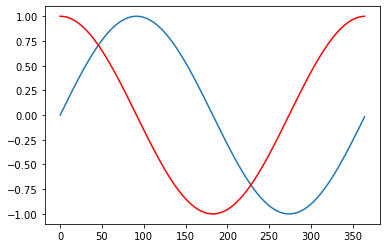

In [182]:
doy = np.arange(0, 365)
sindoy = np.sin(doy / 365 * 2 * np.pi)
cosdoy = np.cos(doy / 365 * 2 * np.pi)
plt.plot(doy, sindoy)
plt.plot(doy, cosdoy, color='red')

In [308]:
from sklearn.preprocessing import MinMaxScaler

In [311]:
A = pd.DataFrame({'a': [1, 22, 25], 'b': [10, 19, 22], 'c': [101, 111, 232], 'd': [1, 2, 3]})
A

,a,b,c,d
0,1,10,101,1
1,22,19,111,2
2,25,22,232,3


In [313]:
scaler = MinMaxScaler()
scaler.fit_transform(A[['b', 'c', 'd']])

array([[0.        , 0.        , 0.        ],
       [0.75      , 0.07633588, 0.5       ],
       [1.        , 1.        , 1.        ]])

In [318]:
z = scaler.fit_transform(Data[[col for col in Data.columns if col != 'lane_vehicle_speed']])

In [319]:
z.shape

(2381, 12)

In [320]:
Data.shape

(2381, 13)

In [18]:
Data = pd.read_excel(Path('c:/projects/nrel-presentation/working/Data.xlsx'))

In [19]:
Data.head()

,timestamp,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy
0,2021-10-26 20:01:00,73.0,6.0,1.0,70.0,4.0,0.0
1,2021-10-26 20:02:00,74.0,2.0,1.0,66.0,3.0,1.0
2,2021-10-26 20:03:00,69.0,6.0,2.0,63.0,4.0,1.0
3,2021-10-26 20:04:00,69.0,7.0,2.0,65.0,5.0,1.0
4,2021-10-26 20:05:00,66.0,4.0,1.0,67.0,3.0,0.0


In [20]:
Data.set_index('timestamp', inplace=True)

In [4]:
Data_scaled = pd.read_parquet(Path('c:/projects/nrel-presentation/data/processed/Data_scaled.pq'))

In [5]:
Data_scaled

,lane_vehicle_speed,lane_vehicle_count,occupancy,ds_lane_vehicle_speed,ds_lane_vehicle_count,ds_occupancy,hod,sin_hod,cos_hod,is_dow_2,is_dow_3,is_dow_4,is_dow_5,is_dow_6,sin_doy,cos_doy
timestamp,,,,,,,,,,,,,,,,
2021-10-26 20:00:00,0.647001,0.159304,0.126002,0.491900,0.184578,0.071225,0.869565,0.146447,0.853553,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-26 20:10:00,0.644248,0.244980,0.134021,0.563328,0.240437,0.076923,0.869565,0.146447,0.853553,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-26 20:20:00,0.732743,0.144578,0.061856,0.640648,0.174863,0.051282,0.869565,0.146447,0.853553,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-26 20:30:00,0.520354,0.148594,0.082474,0.548355,0.163934,0.064103,0.869565,0.146447,0.853553,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-26 20:40:00,0.619469,0.163766,0.080183,0.631811,0.142077,0.042735,0.869565,0.146447,0.853553,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-31 07:50:00,0.529007,0.104418,0.061856,0.683358,0.076503,0.012821,0.304348,0.933013,0.250000,0.0,0.0,0.0,0.0,1.0,1.0,1.0
2021-10-31 08:00:00,0.527434,0.072289,0.020619,0.802230,0.092896,0.025641,0.347826,0.853553,0.146447,0.0,0.0,0.0,0.0,1.0,1.0,1.0
2021-10-31 08:10:00,0.594690,0.140562,0.072165,0.599902,0.136612,0.038462,0.347826,0.853553,0.146447,0.0,0.0,0.0,0.0,1.0,1.0,1.0


In [6]:
Data_scaled.hvplot(subplots=True, height=150).cols(1)

:NdLayout   [Variable]
   :Curve   [timestamp]   (value)

In [13]:
data_scaled_plot = Data_scaled.hvplot(subplots=True, height=150, width=800).cols(1)

In [8]:
import hvplot

In [14]:
hvplot.save(data_scaled_plot, Path('c:/projects/nrel-presentation/working/Data_scaled.png'))

In [60]:
# scaler stuff
Data = np.arange(72).reshape((6, 12)).T
Data

array([[ 0, 12, 24, 36, 48, 60],
       [ 1, 13, 25, 37, 49, 61],
       [ 2, 14, 26, 38, 50, 62],
       [ 3, 15, 27, 39, 51, 63],
       [ 4, 16, 28, 40, 52, 64],
       [ 5, 17, 29, 41, 53, 65],
       [ 6, 18, 30, 42, 54, 66],
       [ 7, 19, 31, 43, 55, 67],
       [ 8, 20, 32, 44, 56, 68],
       [ 9, 21, 33, 45, 57, 69],
       [10, 22, 34, 46, 58, 70],
       [11, 23, 35, 47, 59, 71]])